Universidade Federal de Santa Catarina<br>
Departamento de Engenharia Elétrica e Eletrônica<br>
EEL7514/EEL7513 - Introdução ao Aprendizado de Máquina
$\newcommand{\bX}{\mathbf{X}}$
$\newcommand{\bw}{\mathbf{w}}$
$\newcommand{\by}{\mathbf{y}}$
$\newcommand{\bx}{\mathbf{x}}$
$\newcommand{\bU}{\mathbf{U}}$
$\newcommand{\bu}{\mathbf{u}}$
$\newcommand{\bT}{\mathbf{T}}$
$\newcommand{\RR}{\mathbb{R}}$
$\newcommand{\calS}{\mathcal{S}}$


# Exercício 10: Redes Convolucionais



- Usando Keras/TensorFlow, treine uma rede convolucional nas bases MNIST e CIFAR-10. Tente conseguir uma acurácia de 99% no MNIST e 80% no CIFAR-10. Referências: [Tutorial 1](http://adventuresinmachinelearning.com/keras-tutorial-cnn-11-lines/) e [Tutorial 2](https://www.learnopencv.com/image-classification-using-convolutional-neural-networks-in-keras/).
- Visualize o que cada camada da rede "aprendeu"; mais precisamente, mostre exemplos de imagens de entrada que maximizam a ativação dos filtros em cada camada. Referência: [Tutorial 3](https://blog.keras.io/how-convolutional-neural-networks-see-the-world.html).

### Dicas de implementação
- Para reduzir o tempo de treinamento de uma rede convolucional, é muito importante fazer uso de uma GPU (Graphical Processing Unit), a qual é capaz de produzir um ganho de eficiência de cerca 10 a 20 vezes em comparação com o processamento em CPU. Caso não disponha de placa apropriada, você pode utilizar a plataforma Colab do Google: http://colab.research.google.com. Certifique-se de selecionar a opção GPU no menu Runtime.

---

# Resolução

## Bibliotecas

In [23]:
import tensorflow as tf
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.nn import relu, softmax
from tensorflow.keras.utils import normalize, to_categorical
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
# more info on callbakcs: https://keras.io/callbacks/ model saver
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.models import load_model

import time

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

## MNIST

In [2]:
mnist = tf.keras.datasets.mnist

(X_train, y_train),(X_test, y_test) = mnist.load_data()

In [3]:
X_train[0].shape

(28, 28)

[]

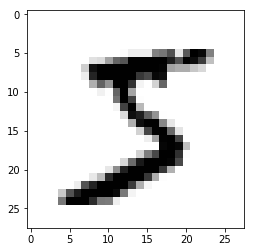

In [4]:
plt.imshow(X_train[0],cmap=plt.cm.binary)
plt.plot()

In [5]:
X_train = normalize(X_train, axis=1)
X_test = normalize(X_test, axis=1)

In [6]:
X_train = X_train.reshape(X_train.shape[0], 28, 28, 1)
X_test = X_test.reshape(X_test.shape[0], 28, 28, 1)

X_train.shape

(60000, 28, 28, 1)

In [7]:
# y_train = to_categorical(y_train, 10)
# y_test = to_categorical(y_test, 10)

y_train.shape

(60000,)

In [8]:
NAME = f"MNIST-{int(time.time())}"
print(NAME)

model = Sequential()

model.add(Conv2D(32, kernel_size=(5, 5), strides=(1, 1), input_shape=X_train.shape[1:]))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

model.add(Conv2D(64, (5, 5)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())

model.add(Dense(1000))
model.add(Activation('relu'))

model.add(Dense(10))
model.add(Activation('softmax'))

tensorboard = TensorBoard(log_dir=f"logs/{NAME}")

model.compile(loss='sparse_categorical_crossentropy',
              optimizer=Adam(),
              metrics=['accuracy'])

history = model.fit(X_train, y_train,
          batch_size=128,
          epochs=10,
          verbose=1,
          validation_data=(X_test, y_test),
          callbacks=[tensorboard])

model.save(NAME+'.h5')
model.save_weights(NAME+'-weigths'+'.h5')

MNIST-1539320160
Train on 60000 samples, validate on 10000 samples
Epoch 1/10
60000/60000 [==============================] - 9s 157us/step - loss: 0.1847 - acc: 0.9436 - val_loss: 0.0603 - val_acc: 0.9820
Epoch 2/10
60000/60000 [==============================] - 8s 133us/step - loss: 0.0499 - acc: 0.9845 - val_loss: 0.0375 - val_acc: 0.9887
Epoch 3/10
60000/60000 [==============================] - 8s 132us/step - loss: 0.0342 - acc: 0.9896 - val_loss: 0.0327 - val_acc: 0.9893
Epoch 4/10
60000/60000 [==============================] - 7s 116us/step - loss: 0.0242 - acc: 0.9924 - val_loss: 0.0301 - val_acc: 0.9900
Epoch 5/10
60000/60000 [==============================] - 8s 132us/step - loss: 0.0198 - acc: 0.9935 - val_loss: 0.0333 - val_acc: 0.9894
Epoch 6/10
60000/60000 [==============================] - 7s 123us/step - loss: 0.0151 - acc: 0.9951 - val_loss: 0.0303 - val_acc: 0.9908
Epoch 7/10
60000/60000 [==============================] - 6s 95us/step - loss: 0.0111 - acc: 0.9961 - val

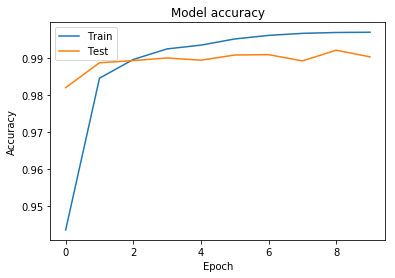

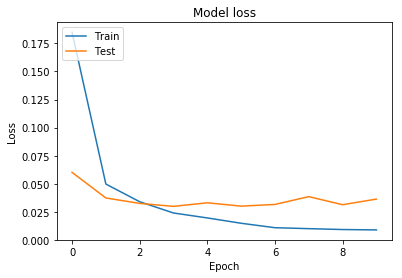

In [9]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [10]:
score = model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.03653631696299126
Test accuracy: 0.9903


Com o uso de uma rede convolucional, conseguimos resultados melhores do que conseguimos apenas com uma rede neural profunda.

In [11]:
predictions = model.predict(X_test)

pred = [np.argmax(predictions[i]) for i in range(10)]
print("Conjunto de teste: ", y_test[0:10])
print("Predição: ", pred[0:10])

Conjunto de teste:  [7 2 1 0 4 1 4 9 5 9]
Predição:  [7, 2, 1, 0, 4, 1, 4, 9, 5, 9]


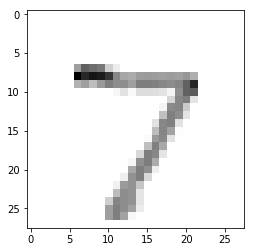

predição:  7


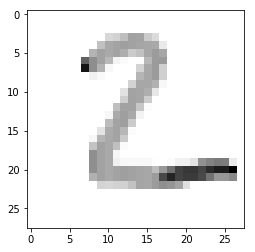

predição:  2


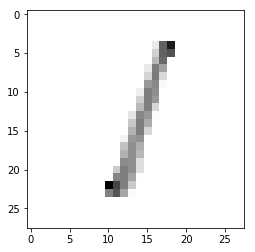

predição:  1


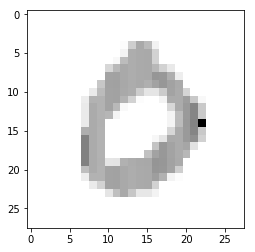

predição:  0


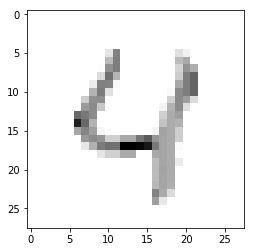

predição:  4


In [12]:
image = X_test.reshape(-1,28,28)
for i in range(5):
    plt.imshow(image[i],cmap=plt.cm.binary)
    plt.show()
    print("predição: ",pred[i])

## CIFAR10

In [12]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

X_train.shape

(50000, 32, 32, 3)

In [13]:
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train /= 255
X_test /= 255

In [14]:
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

In [15]:
y_train[0]

array([0., 0., 0., 0., 0., 0., 1., 0., 0., 0.], dtype=float32)

In [17]:
NAME = f"CIFAR10-new-{int(time.time())}"
print(NAME)

model = Sequential()

model.add(Conv2D(32, (3, 3), padding='same', input_shape=X_train.shape[1:]))
model.add(Activation('relu'))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())

model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(Dense(10))
model.add(Activation('softmax'))

# opt = RMSprop(lr=0.0001, decay=1e-6)

tensorboard = TensorBoard(log_dir=f"logs/{NAME}")

model.compile(optimizer='RMSprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history = model.fit(X_train, y_train,
          batch_size=256,
          epochs=100,
          verbose=1,
          validation_data=(X_test, y_test),
          callbacks=[tensorboard])

model.save(NAME+'.h5')
model.save_weights(NAME+'-weigths'+'.h5')

CIFAR10-new-1539610327
Train on 50000 samples, validate on 10000 samples
Epoch 1/100
50000/50000 [==============================] - 15s 307us/step - loss: 2.0612 - acc: 0.2440 - val_loss: 1.7649 - val_acc: 0.3614
Epoch 2/100
50000/50000 [==============================] - 10s 209us/step - loss: 1.7009 - acc: 0.3829 - val_loss: 2.1134 - val_acc: 0.2967
Epoch 3/100
50000/50000 [==============================] - 10s 207us/step - loss: 1.5282 - acc: 0.4459 - val_loss: 1.4979 - val_acc: 0.4521
Epoch 4/100
50000/50000 [==============================] - 10s 207us/step - loss: 1.3974 - acc: 0.4989 - val_loss: 1.3062 - val_acc: 0.5292
Epoch 5/100
50000/50000 [==============================] - 10s 206us/step - loss: 1.2872 - acc: 0.5423 - val_loss: 1.2581 - val_acc: 0.5405
Epoch 6/100
50000/50000 [==============================] - 11s 212us/step - loss: 1.1887 - acc: 0.5790 - val_loss: 1.1021 - val_acc: 0.6170
Epoch 7/100
50000/50000 [==============================] - 11s 213us/step - loss: 1.112

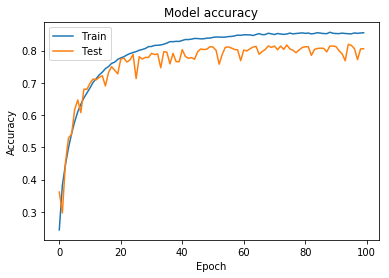

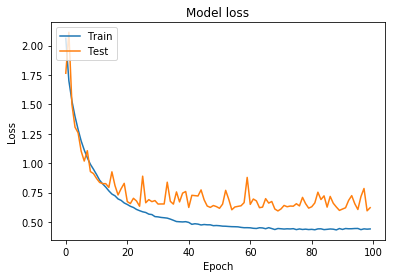

In [18]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [19]:
score = model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.6210582882404327
Test accuracy: 0.8056


### Observações

Observando o resultado, percebe-se que a convergência se dá perto das 20 primeiras épocas e após isso a acurácia do conjunto de treinamento aumenta mais do que o de teste, causando overfitting.

## CIFAR10 with Data Augmentation

In [20]:
datagen = ImageDataGenerator(
#     rotation_range=10.,
    width_shift_range=0.1,
    height_shift_range=0.1,
#     shear_range=0.,
#     zoom_range=.1.,
    horizontal_flip=True,
    vertical_flip=False)

In [21]:
NAME = f"CIFAR10-data_aug-new-{int(time.time())}"
print(NAME)

model2 = Sequential()

model2.add(Conv2D(32, (3, 3), padding='same', input_shape=X_train.shape[1:]))
model2.add(Activation('relu'))

model2.add(Conv2D(32, (3, 3)))
model2.add(Activation('relu'))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.25))

model2.add(Conv2D(64, (3, 3), padding='same'))
model2.add(Activation('relu'))

model2.add(Conv2D(64, (3, 3)))
model2.add(Activation('relu'))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.25))

model2.add(Conv2D(64, (3, 3), padding='same'))
model2.add(Activation('relu'))

model2.add(Conv2D(64, (3, 3)))
model2.add(Activation('relu'))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.25))

model2.add(Flatten())

model2.add(Dense(512))
model2.add(Activation('relu'))
model2.add(Dropout(0.5))

model2.add(Dense(10))
model2.add(Activation('softmax'))

# opt = RMSprop(lr=0.0001, decay=1e-6)

tensorboard = TensorBoard(log_dir=f"logs/{NAME}")

model2.compile(optimizer='RMSprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history2 = model2.fit_generator(datagen.flow(X_train, y_train,
                                batch_size=256),
                                steps_per_epoch=int(np.ceil(X_train.shape[0] / float(256))),
                                epochs=100,
                                validation_data=(X_test, y_test),
                                workers=4,
                                callbacks=[tensorboard])

model.save(NAME+'.h5')
model.save_weights(NAME+'-weigths'+'.h5')

CIFAR10-data_aug-new-1539611567
Epoch 1/100
196/196 [==============================] - 15s 77ms/step - loss: 2.1080 - acc: 0.2194 - val_loss: 2.1562 - val_acc: 0.2409
Epoch 2/100
196/196 [==============================] - 13s 65ms/step - loss: 1.7940 - acc: 0.3428 - val_loss: 1.6181 - val_acc: 0.4058
Epoch 3/100
196/196 [==============================] - 13s 68ms/step - loss: 1.6073 - acc: 0.4104 - val_loss: 1.4935 - val_acc: 0.4745
Epoch 4/100
196/196 [==============================] - 13s 67ms/step - loss: 1.4824 - acc: 0.4622 - val_loss: 1.2602 - val_acc: 0.5420
Epoch 5/100
196/196 [==============================] - 13s 67ms/step - loss: 1.3857 - acc: 0.5004 - val_loss: 1.2168 - val_acc: 0.5582
Epoch 6/100
196/196 [==============================] - 13s 66ms/step - loss: 1.3149 - acc: 0.5276 - val_loss: 1.1463 - val_acc: 0.5868
Epoch 7/100
196/196 [==============================] - 13s 65ms/step - loss: 1.2507 - acc: 0.5545 - val_loss: 1.2859 - val_acc: 0.5501
Epoch 8/100
196/196 [==

196/196 [==============================] - 15s 75ms/step - loss: 0.6402 - acc: 0.7854 - val_loss: 0.6452 - val_acc: 0.7884
Epoch 62/100
196/196 [==============================] - 15s 74ms/step - loss: 0.6395 - acc: 0.7863 - val_loss: 0.5550 - val_acc: 0.8154
Epoch 63/100
196/196 [==============================] - 15s 75ms/step - loss: 0.6378 - acc: 0.7858 - val_loss: 0.7301 - val_acc: 0.7573
Epoch 64/100
196/196 [==============================] - 15s 75ms/step - loss: 0.6331 - acc: 0.7877 - val_loss: 0.5771 - val_acc: 0.8135
Epoch 65/100
196/196 [==============================] - 15s 75ms/step - loss: 0.6389 - acc: 0.7869 - val_loss: 0.6353 - val_acc: 0.7947
Epoch 66/100
196/196 [==============================] - 15s 75ms/step - loss: 0.6333 - acc: 0.7886 - val_loss: 0.7024 - val_acc: 0.7751
Epoch 67/100
196/196 [==============================] - 15s 75ms/step - loss: 0.6324 - acc: 0.7873 - val_loss: 0.6536 - val_acc: 0.7845
Epoch 68/100
196/196 [==============================] - 15s 7

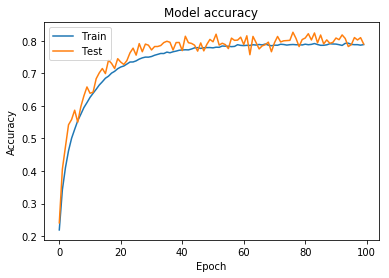

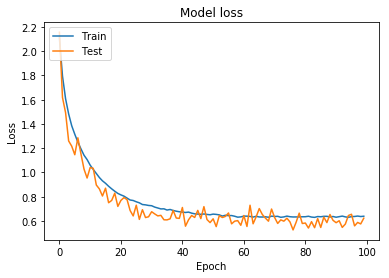

In [24]:
# Plot training & validation accuracy values
plt.plot(history2.history['acc'])
plt.plot(history2.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history2.history['loss'])
plt.plot(history2.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [25]:
score = model2.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.6231204941749573
Test accuracy: 0.7901


### Observações

Utilizando a ferramenta ImageDataGeneration para criar novas imagens, rotacionando e deslocando as já existentes, resultamos num conjunto maior para treinamento e com isso observando a curva temos que a acurácia de teste se encontra superior ao de treinamento, que é algo desejável.

## Visualização de imagens de entrada que maximizam a ativação dos filtros nas camadas

In [59]:
from __future__ import print_function

import numpy as np
import time
import cv2

from keras.preprocessing.image import save_img
from keras.applications import vgg16
from keras import backend as K


In [4]:
# build the VGG16 network with ImageNet weights
model = vgg16.VGG16(weights='imagenet', include_top=False)
print('Model loaded.')

model.summary()

Model loaded.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0      

In [65]:
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + K.epsilon())
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    if K.image_data_format() == 'channels_first':
        x = x.transpose((1, 2, 0))
    x = np.clip(x, 0, 255).astype('uint8')
    return x

def normalize(x):
    # utility function to normalize a tensor by its L2 norm
    return x / (K.sqrt(K.mean(K.square(x))) + K.epsilon())

def visualize(layer_name, filters_range=200, n=8):
    # dimensions of the generated pictures for each filter.
    img_width = 128
    img_height = 128

    # this is the placeholder for the input images
    input_img = model.input

    # get the symbolic outputs of each "key" layer (we gave them unique names).
    layer_dict = dict([(layer.name, layer) for layer in model.layers[1:]])

    kept_filters = []
    for filter_index in range(filters_range):
        # we only scan through the first 200 filters,
        # but there are actually 512 of them
#         print('Processing filter %d' % filter_index)
#         start_time = time.time()

        # we build a loss function that maximizes the activation
        # of the nth filter of the layer considered
        layer_output = layer_dict[layer_name].output
        if K.image_data_format() == 'channels_first':
            loss = K.mean(layer_output[:, filter_index, :, :])
        else:
            loss = K.mean(layer_output[:, :, :, filter_index])

        # we compute the gradient of the input picture wrt this loss
        grads = K.gradients(loss, input_img)[0]

        # normalization trick: we normalize the gradient
        grads = normalize(grads)

        # this function returns the loss and grads given the input picture
        iterate = K.function([input_img], [loss, grads])

        # step size for gradient ascent
        step = 1.

        # we start from a gray image with some random noise
        if K.image_data_format() == 'channels_first':
            input_img_data = np.random.random((1, 3, img_width, img_height))
        else:
            input_img_data = np.random.random((1, img_width, img_height, 3))
        input_img_data = (input_img_data - 0.5) * 20 + 128

        # we run gradient ascent for 20 steps
        for i in range(20):
            loss_value, grads_value = iterate([input_img_data])
            input_img_data += grads_value * step

    #         print('Current loss value:', loss_value)
            if loss_value <= 0.:
                # some filters get stuck to 0, we can skip them
                break

        # decode the resulting input image
        if loss_value > 0:
            img = deprocess_image(input_img_data[0])
            kept_filters.append((img, loss_value))
        end_time = time.time()
    #     print('Filter %d processed in %ds' % (filter_index, end_time - start_time))

    # we will stich the best 64 filters on a 8 x 8 grid.
#     n = 8

    # the filters that have the highest loss are assumed to be better-looking.
    # we will only keep the top 64 filters.
    kept_filters.sort(key=lambda x: x[1], reverse=True)
    kept_filters = kept_filters[:n * n]

    # build a black picture with enough space for
    # our 8 x 8 filters of size 128 x 128, with a 5px margin in between
    margin = 5
    width = n * img_width + (n - 1) * margin
    height = n * img_height + (n - 1) * margin
    stitched_filters = np.zeros((width, height, 3))

    # fill the picture with our saved filters
    for i in range(n):
        for j in range(n):
            img, loss = kept_filters[i * n + j]
            width_margin = (img_width + margin) * i
            height_margin = (img_height + margin) * j
            stitched_filters[
                width_margin: width_margin + img_width,
                height_margin: height_margin + img_height, :] = img

    # save the result to disk

    save_img(f'stitched_filters_{layer_name}.png', stitched_filters)

In [66]:
visualize('block1_conv1', 48, 6)

visualize('block2_conv1', 100)

visualize('block3_conv1')

visualize('block4_conv1')

visualize('block5_conv1')

### Block1 Conv1 

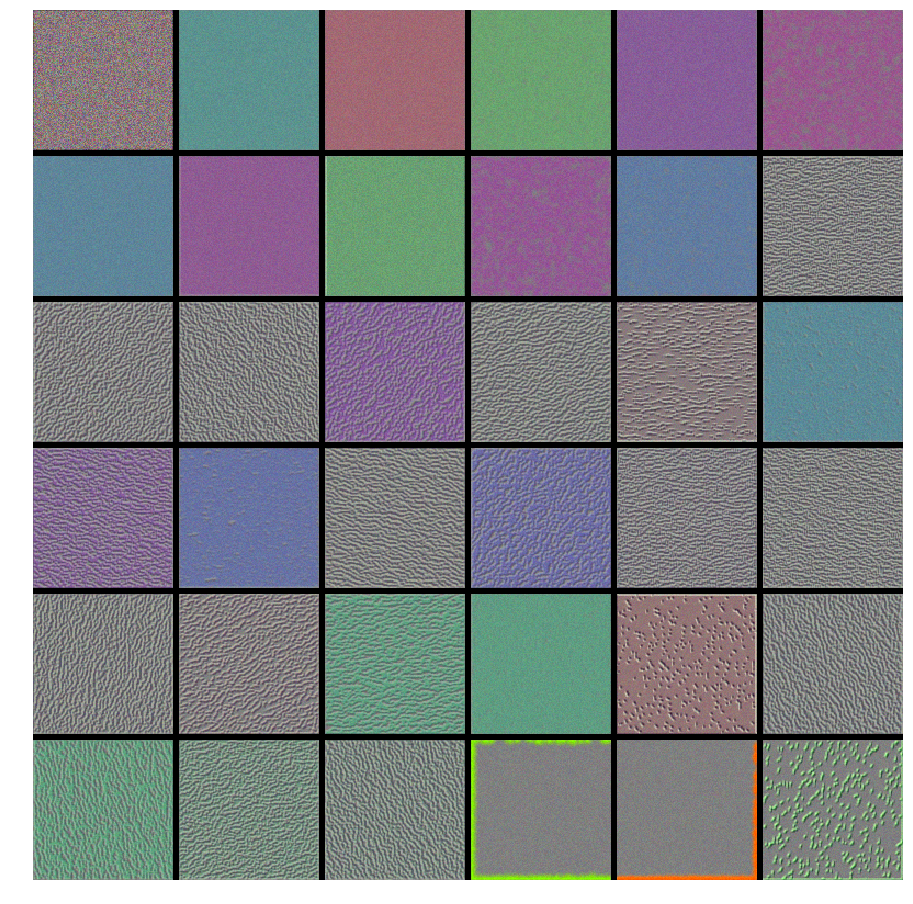

In [77]:
block1 = cv2.imread("stitched_filters_block1_conv1.png")
plt.figure(figsize=(16,16))
plt.axis("off")
plt.imshow(block1)
plt.show()

### Block2 Conv1

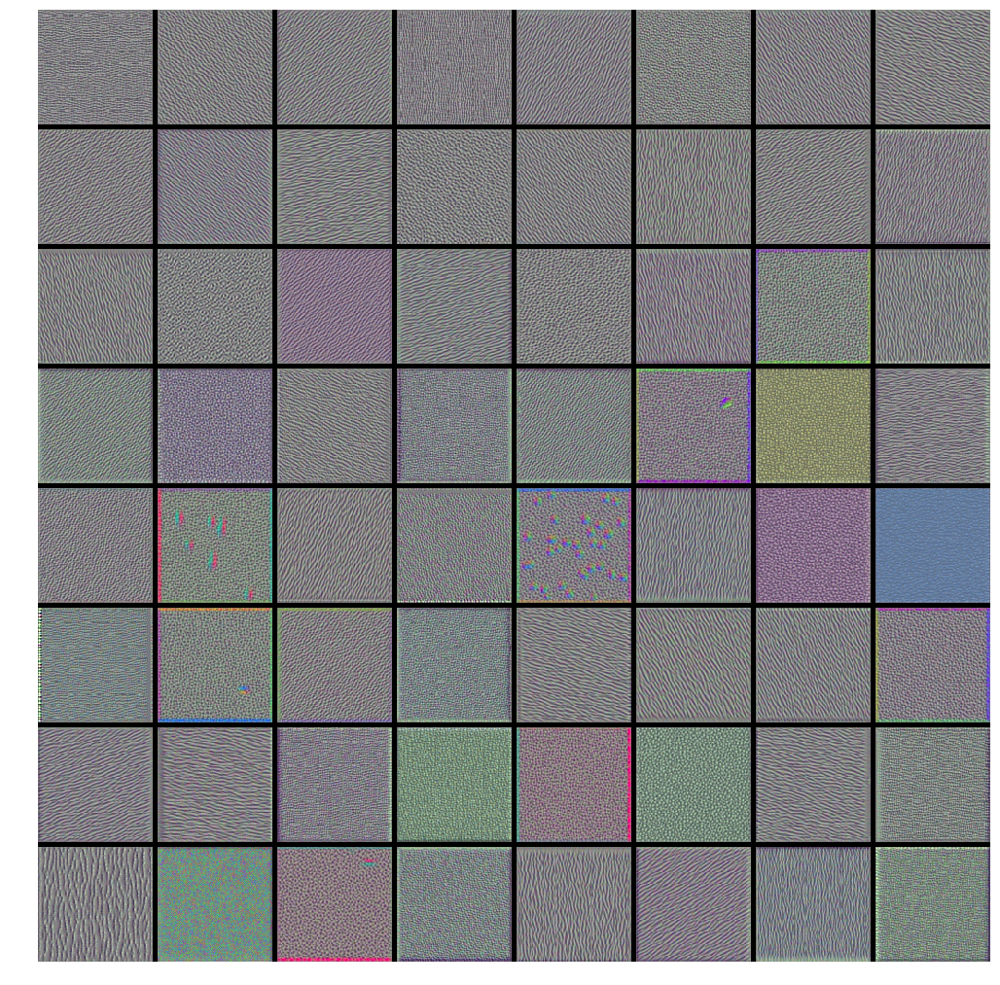

In [78]:
block2 = cv2.imread("stitched_filters_block2_conv1.png")
plt.figure(figsize=(18,18))
plt.axis("off")
plt.imshow(block2)
plt.show()

### Block3 Conv1

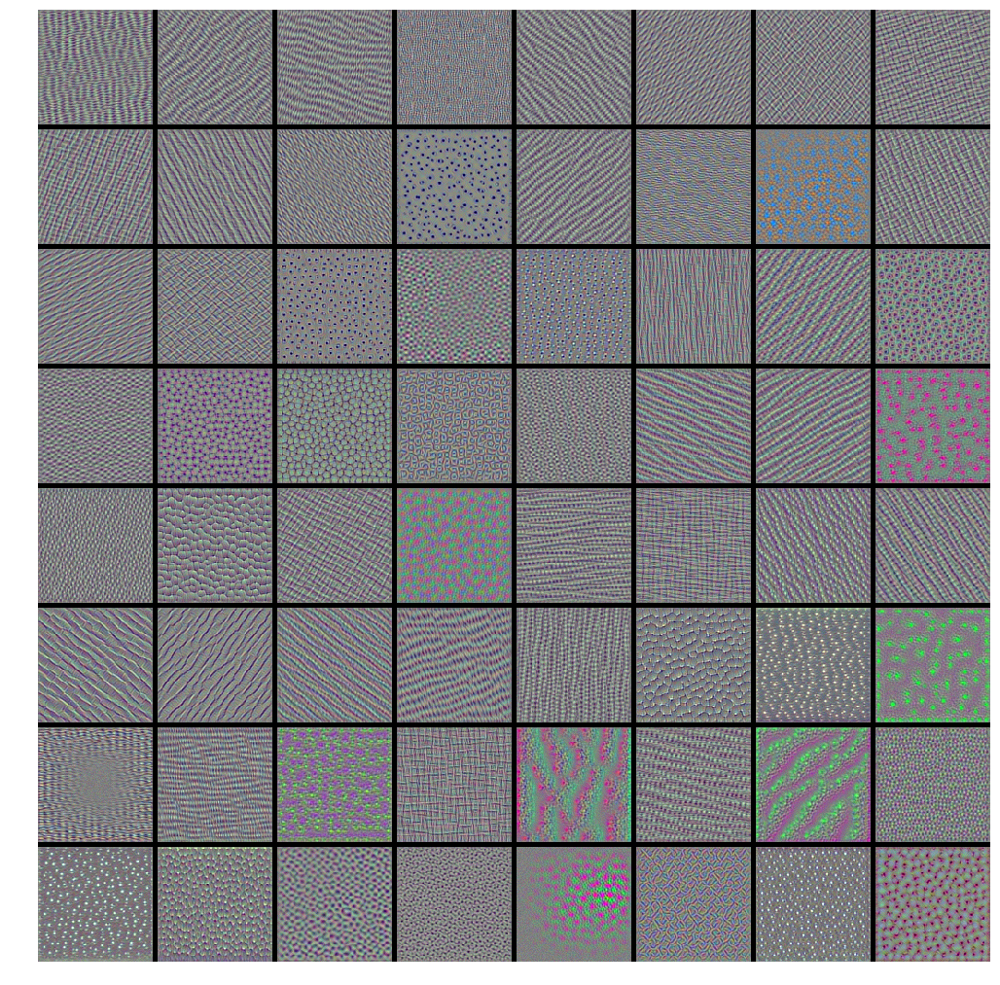

In [79]:
block3 = cv2.imread("stitched_filters_block3_conv1.png")
plt.figure(figsize=(18,18))
plt.axis("off")
plt.imshow(block3)
plt.show()

### Block4 Conv1

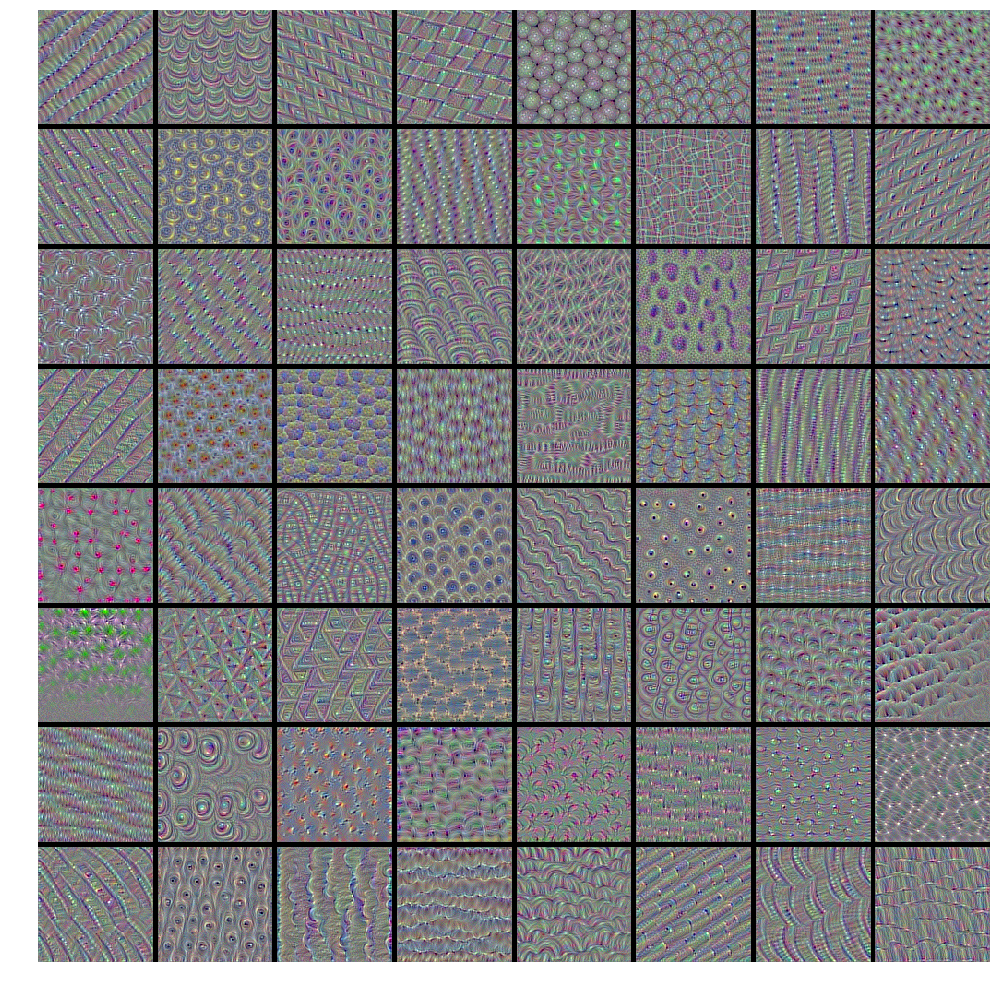

In [74]:
block4 = cv2.imread("stitched_filters_block4_conv1.png")
plt.figure(figsize=(18,18))
plt.axis("off")
plt.imshow(block4)
plt.show()

### Block5 Conv1

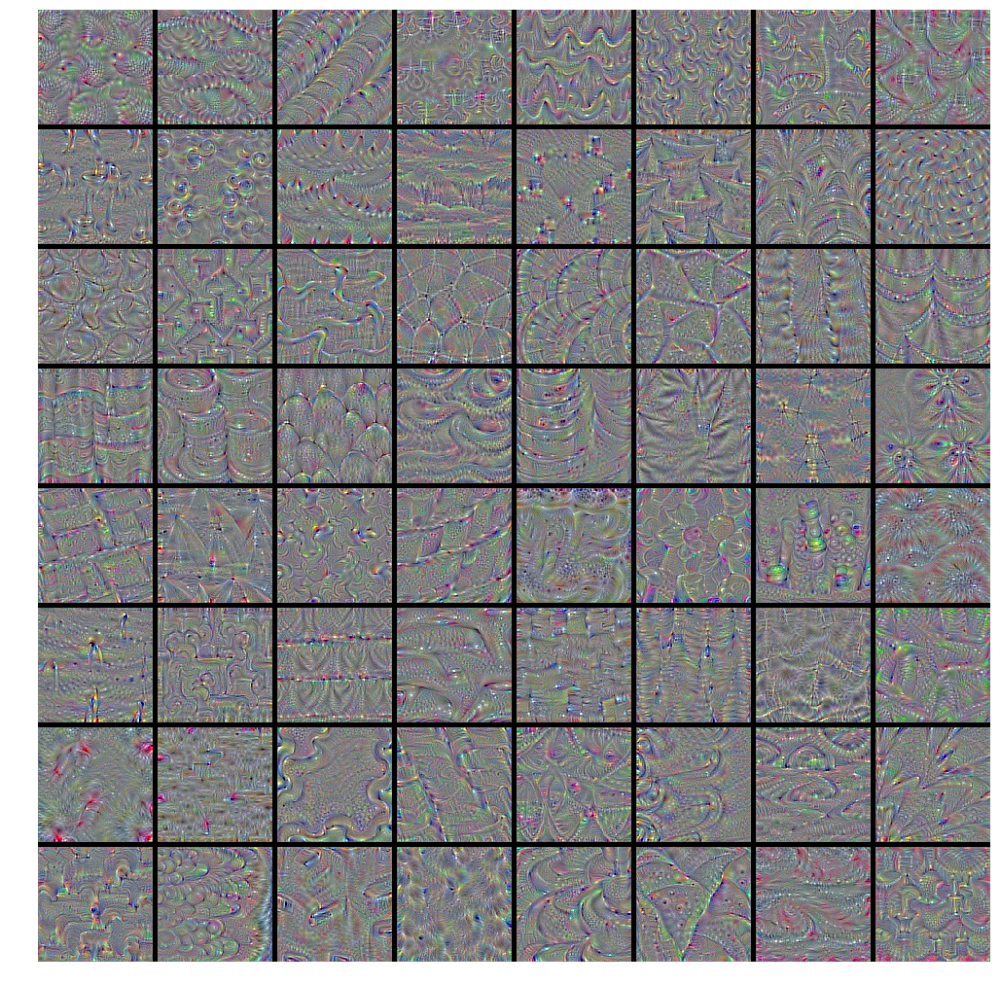

In [76]:
block5 = cv2.imread("stitched_filters_8x8.png")
plt.figure(figsize=(18,18))
plt.axis("off")
plt.imshow(block5)
plt.show()

### Observações

Observando as imagens, percebe-se que as camadas convolucionais mais profundas aprendem padrões mais complexos do que as primeiras.